# A capstone project on 'Loan default prediction' 
-ANKIT BHANDARI KSHETRI(21107)

# About the dataset
The analyzed dataset is a BANK LOAN DEFAULT DATASET of a Portuguese banking institution sourced from ‘kaggle’. We are trying to predict the loan default likelihood from the given inputs. 

# Importing required libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import LabelEncoder

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn import tree
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# Chapter 1: Understanding the Dataset

# The dataset names"outlier" is loaded as "df".

In [2]:
df= pd.read_csv("outlier.csv")

In [3]:
df.head(20)

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,1001,999.0,management,married,tertiary,no,2143.0,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,1002,44.0,technician,single,secondary,no,29.0,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,1003,33.0,entrepreneur,married,secondary,no,2.0,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,1004,47.0,blue-collar,married,unknown,no,1506.0,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,1005,33.0,unknown,single,unknown,no,1.0,no,no,unknown,5,may,198,1,-1,0,unknown,no
5,1006,35.0,management,married,tertiary,no,231.0,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,1007,28.0,management,single,tertiary,no,447.0,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,1008,NaN,entrepreneur,divorced,tertiary,yes,NaN,yes,no,unknown,5,may,380,1,-1,0,unknown,no
8,1009,58.0,retired,married,primary,no,NaN,yes,no,unknown,5,may,50,1,-1,0,unknown,no
9,1010,43.0,technician,single,secondary,no,NaN,yes,no,unknown,5,may,55,1,-1,0,unknown,no


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Id         45211 non-null  int64  
 1   age        45202 non-null  float64
 2   job        45211 non-null  object 
 3   marital    45211 non-null  object 
 4   education  45211 non-null  object 
 5   default    45211 non-null  object 
 6   balance    45208 non-null  float64
 7   housing    45211 non-null  object 
 8   loan       45211 non-null  object 
 9   contact    45211 non-null  object 
 10  day        45211 non-null  int64  
 11  month      45211 non-null  object 
 12  duration   45211 non-null  int64  
 13  campaign   45211 non-null  int64  
 14  pdays      45211 non-null  int64  
 15  previous   45211 non-null  int64  
 16  poutcome   45211 non-null  object 
 17  y          45211 non-null  object 
dtypes: float64(2), int64(6), object(10)
memory usage: 6.2+ MB


In [5]:
df.describe()

,Id,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45202.000000,45208.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,23606.000000,40.954714,1362.346620,15.806419,258.163080,2.763841,40.197828,0.580323
std,13051.435847,11.539144,3044.852387,8.322476,257.527812,3.098021,100.128746,2.303441
min,1001.000000,-1.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,12303.500000,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,23606.000000,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,34908.500000,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,46211.000000,999.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [6]:
df.shape

(45211, 18)

In [7]:
df.isna().sum()

Id           0
age          9
job          0
marital      0
education    0
default      0
balance      3
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

# Chapter 2: Exploratory data analysis(EDA)/Preprocessing

# Data cleaning

# Filling missing values

# PROBLEM SEEN ON THIS DATASET, when i fill the missing values of a float64 column with its mean, that changes its data type to object. 

# Solution: 
To ensure the data type remains as float64, I applied these steps:

Calculate the mean of the float64 column excluding the missing values.
Fill the missing values using the calculated mean value.
Verify the data type of the column after filling the missing values.

# Therefore, because of above reason i filled the missing values by creating mean as a different variable instead of the normal df['Columns'].fillna(df['column'].mean())

<Axes: title={'center': 'Missing values'}>

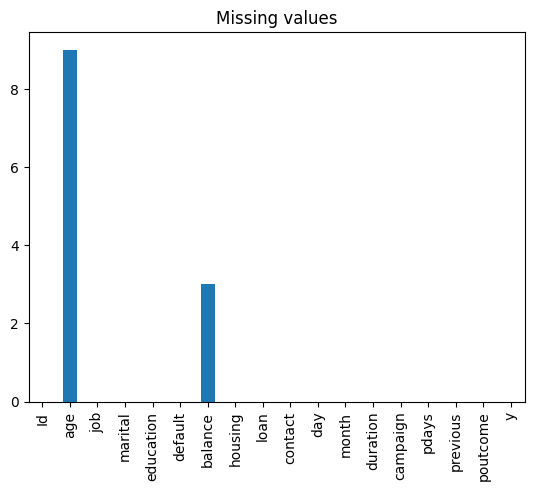

In [8]:
df.isna().sum().plot(kind='bar', title='Missing values')

# Filling the missing values with the calculated mean

For age column

In [9]:
age_mean= df['age'].mean()
print(age_mean)

40.954714393168445


In [10]:
df['age'].fillna(age_mean,inplace=True)

For balance column

In [11]:
balance_mean= df['balance'].mean()
print(balance_mean)

1362.3466200672447


In [12]:
df['balance'].fillna(balance_mean,inplace=True)

In [13]:
df.isna().sum()

Id           0
age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [14]:
df.dtypes

Id             int64
age          float64
job           object
marital       object
education     object
default       object
balance      float64
housing       object
loan          object
contact       object
day            int64
month         object
duration       int64
campaign       int64
pdays          int64
previous       int64
poutcome      object
y             object
dtype: object

# If the missing values are less than 5% drop them, no need to fill BUT here we did not drop the values because we want to fill them for maximum data retention

In [15]:
df.isna().sum()

Id           0
age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

# Treatment of outliers

In [16]:
df.dtypes

Id             int64
age          float64
job           object
marital       object
education     object
default       object
balance      float64
housing       object
loan          object
contact       object
day            int64
month         object
duration       int64
campaign       int64
pdays          int64
previous       int64
poutcome      object
y             object
dtype: object

# Checking for outliers

# Pre cleaning univariate analysis(Before removing outliers)

<Axes: xlabel='age'>

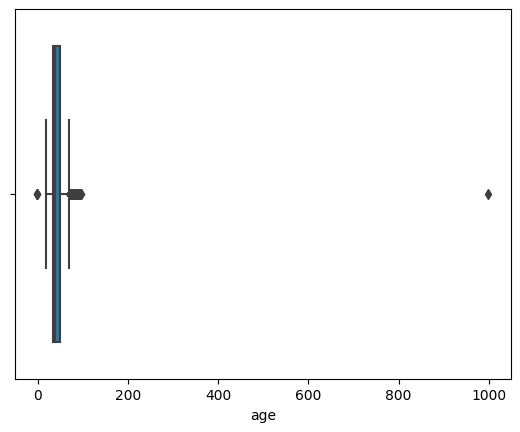

In [17]:
sns.boxplot(df['age'])

<Axes: xlabel='balance'>

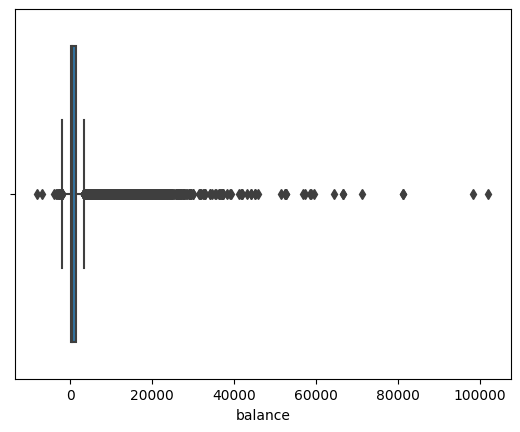

In [18]:
sns.boxplot(df['balance'])

<Axes: xlabel='duration'>

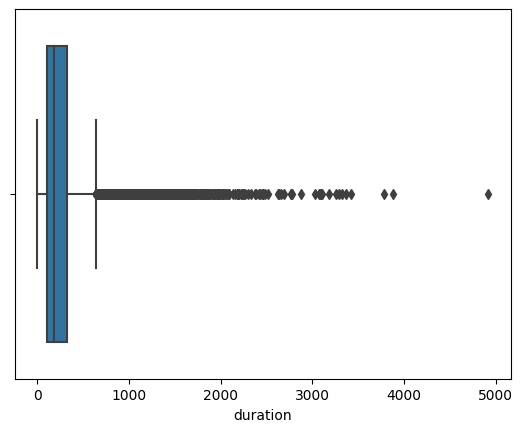

In [19]:
sns.boxplot(df['duration'])

# Checking the data distribution of the fields

<Axes: xlabel='age', ylabel='Density'>

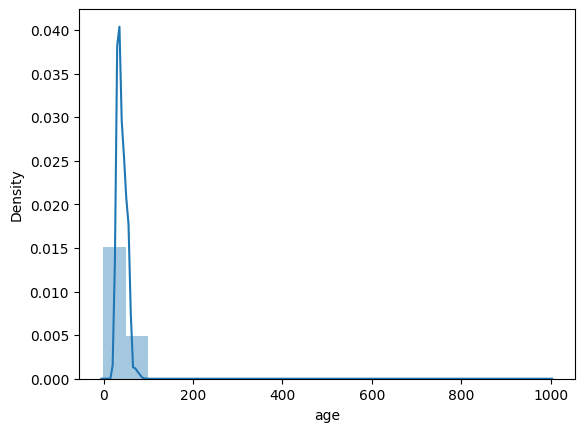

In [20]:
sns.distplot(df['age'],bins=20)

<Axes: xlabel='balance', ylabel='Density'>

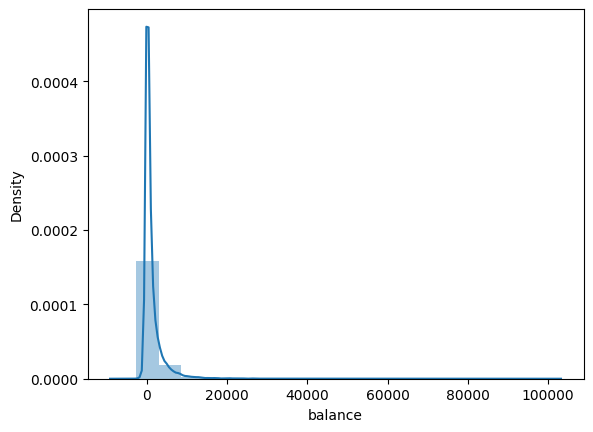

In [21]:
sns.distplot(df['balance'],bins=20)

<Axes: xlabel='duration', ylabel='Density'>

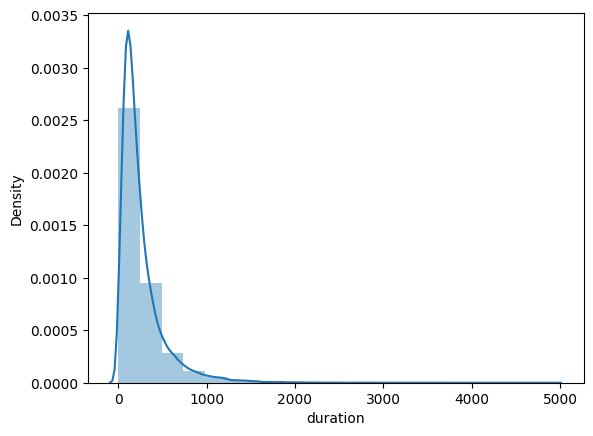

In [22]:
sns.distplot(df['duration'],bins=20)

# Removing outliers by Percentile method

# Threshold for age column

In [23]:
max_threshold_age = df['age'].quantile(0.95)


In [24]:
min_threshold_age = df['age'].quantile(0.05)

In [25]:
print(max_threshold_age,min_threshold_age)

59.0 27.0


In [26]:
df[df['age']>max_threshold_age]

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,1001,999.0,management,married,tertiary,no,2143.0,yes,no,unknown,5,may,261,1,-1,0,unknown,no
18,1019,60.0,retired,married,primary,no,60.0,yes,no,unknown,5,may,219,1,-1,0,unknown,no
32,1033,60.0,admin.,married,secondary,no,39.0,yes,yes,unknown,5,may,208,1,-1,0,unknown,no
42,1043,60.0,blue-collar,married,unknown,no,104.0,yes,no,unknown,5,may,22,1,-1,0,unknown,no
66,1067,60.0,retired,married,tertiary,no,100.0,no,no,unknown,5,may,528,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45185,46186,60.0,services,married,tertiary,no,4256.0,yes,no,cellular,16,nov,200,1,92,4,success,yes
45191,46192,75.0,retired,divorced,tertiary,no,3810.0,yes,no,cellular,16,nov,262,1,183,1,failure,yes
45195,46196,68.0,retired,married,secondary,no,1146.0,no,no,cellular,16,nov,212,1,187,6,success,yes
45207,46208,71.0,retired,divorced,primary,no,1729.0,no,no,cellular,17,nov,456,2,-1,0,unknown,yes


In [27]:
df[df['age']<min_threshold_age]

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
23,1024,25.0,services,married,secondary,no,50.0,yes,no,unknown,5,may,342,1,-1,0,unknown,no
36,1037,25.0,blue-collar,married,secondary,no,-7.0,yes,no,unknown,5,may,365,1,-1,0,unknown,no
135,1136,23.0,blue-collar,married,secondary,no,94.0,yes,no,unknown,5,may,193,1,-1,0,unknown,no
151,1152,26.0,student,single,secondary,no,0.0,yes,no,unknown,5,may,610,2,-1,0,unknown,no
165,1166,26.0,admin.,single,secondary,no,82.0,yes,no,unknown,5,may,228,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45189,46190,25.0,services,single,secondary,no,199.0,no,no,cellular,16,nov,173,1,92,5,failure,no
45196,46197,25.0,student,single,secondary,no,358.0,no,no,cellular,16,nov,330,1,-1,0,unknown,yes
45203,46204,-1.0,student,single,tertiary,no,113.0,no,no,cellular,17,nov,266,1,-1,0,unknown,yes
45204,46205,-1.0,retired,married,secondary,no,2850.0,no,no,cellular,17,nov,300,1,40,8,failure,yes


# Thresholds For balance

In [28]:
max_threshold_bal= df['balance'].quantile(0.85)

In [29]:
min_threshold_bal= df['balance'].quantile(0.25)

In [30]:
print(min_threshold_bal,max_threshold_bal)

72.0 2539.0


# Threshold for duration

In [31]:
max_threshold_dur= df['duration'].quantile(0.90)
min_threshold_dur= df['duration'].quantile(0.15)

In [32]:
print(max_threshold_dur,min_threshold_dur)

548.0 75.0


# Creating a clean new dataframe "df1" with no outliers

In [33]:
df1 = df[(df['age'] > min_threshold_age) & (df['age'] < max_threshold_age) & 
         (df['balance'] > min_threshold_bal) & (df['balance'] < max_threshold_bal)&
         (df['duration']>min_threshold_dur) & (df['duration']< max_threshold_dur)]


In [34]:
df1.head()

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
3,1004,47.000000,blue-collar,married,unknown,no,1506.00000,yes,no,unknown,5,may,92,1,-1,0,unknown,no
5,1006,35.000000,management,married,tertiary,no,231.00000,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,1007,28.000000,management,single,tertiary,no,447.00000,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,1008,40.954714,entrepreneur,divorced,tertiary,yes,1362.34662,yes,no,unknown,5,may,380,1,-1,0,unknown,no
10,1011,41.000000,admin.,divorced,secondary,no,270.00000,yes,no,unknown,5,may,222,1,-1,0,unknown,no


In [35]:
df1.shape

(17698, 18)

In [36]:
df.shape

(45211, 18)

# Post cleaning univariate analysis(After removing outliers)

<Axes: xlabel='balance'>

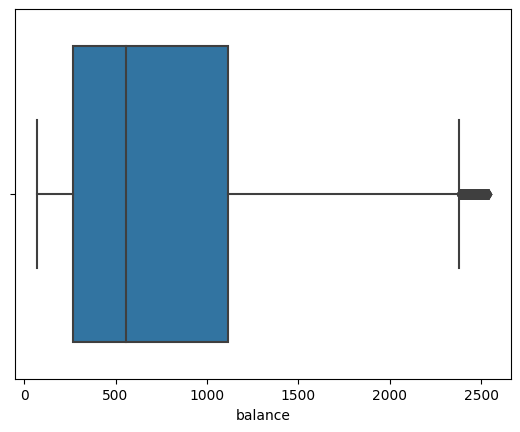

In [37]:
sns.boxplot(data=df1, x= 'balance')

<Axes: xlabel='age'>

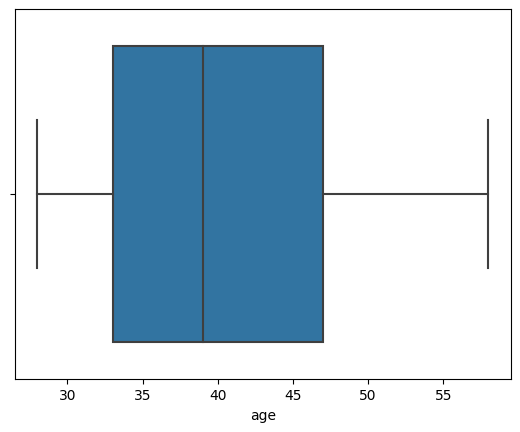

In [38]:
sns.boxplot(data=df1, x= 'age')

<Axes: xlabel='duration'>

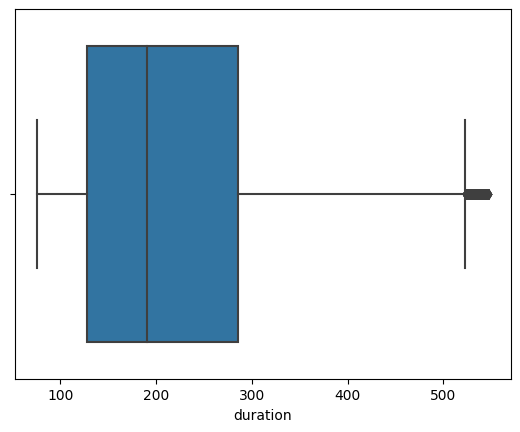

In [39]:
sns.boxplot(df1['duration'])

# Checking the data distribution

<Axes: xlabel='balance', ylabel='Density'>

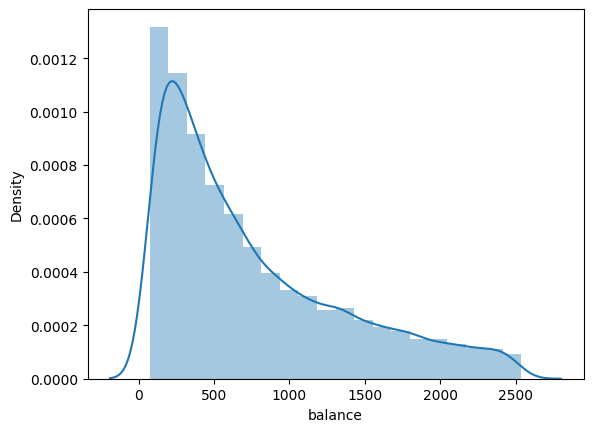

In [40]:
sns.distplot(df1['balance'],bins=20)

<Axes: xlabel='age', ylabel='Density'>

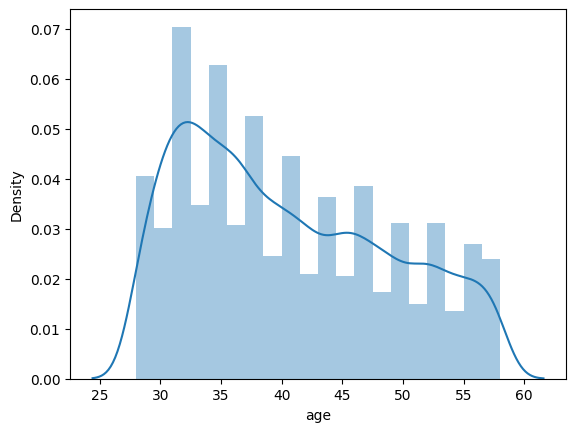

In [41]:
sns.distplot(df1['age'], bins=20)

<Axes: xlabel='duration', ylabel='Density'>

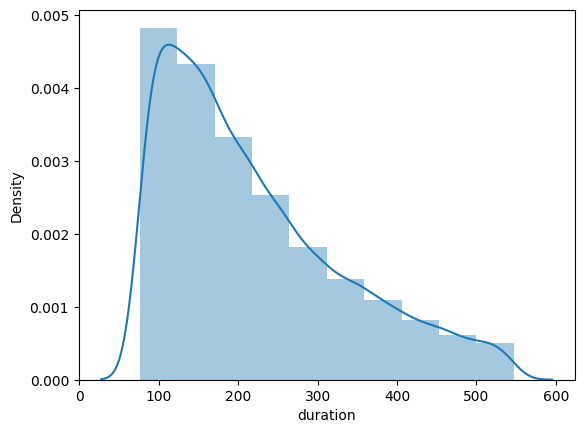

In [42]:
sns.distplot(df1['duration'], bins=10)

In [43]:
df1.describe()

,Id,age,balance,day,duration,campaign,pdays,previous
count,17698.000000,17698.000000,17698.000000,17698.000000,17698.000000,17698.000000,17698.000000,17698.000000
mean,23278.048424,40.482589,761.568389,15.372584,219.576223,2.510962,44.337835,0.616284
std,13118.548653,8.445006,617.987711,8.315307,114.083563,2.406415,104.650880,2.776743
min,1004.000000,28.000000,73.000000,1.000000,76.000000,1.000000,-1.000000,0.000000
25%,11567.250000,33.000000,270.000000,8.000000,128.000000,1.000000,-1.000000,0.000000
50%,23372.500000,39.000000,557.000000,15.000000,190.000000,2.000000,-1.000000,0.000000
75%,34372.500000,47.000000,1114.000000,21.000000,286.000000,3.000000,-1.000000,0.000000
max,46210.000000,58.000000,2538.000000,31.000000,547.000000,51.000000,871.000000,275.000000


In [44]:
df1.head()

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
3,1004,47.000000,blue-collar,married,unknown,no,1506.00000,yes,no,unknown,5,may,92,1,-1,0,unknown,no
5,1006,35.000000,management,married,tertiary,no,231.00000,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,1007,28.000000,management,single,tertiary,no,447.00000,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,1008,40.954714,entrepreneur,divorced,tertiary,yes,1362.34662,yes,no,unknown,5,may,380,1,-1,0,unknown,no
10,1011,41.000000,admin.,divorced,secondary,no,270.00000,yes,no,unknown,5,may,222,1,-1,0,unknown,no


# Bivariate and multivariate analysis

# Relationship between balance and default

Text(0.5, 1.0, 'Violin plot of balance and default')

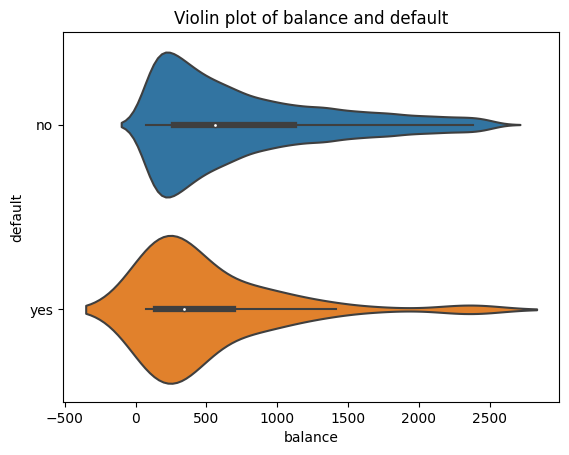

In [45]:
sns.violinplot(data=df1, x= 'balance', y='default')
plt.title('Violin plot of balance and default')

# Relationship between balance and default layered with education

Text(0.5, 1.0, 'Box plot of balance and default layered with education')

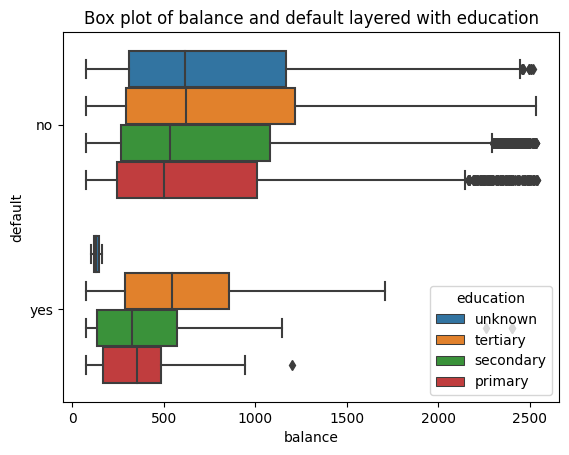

In [46]:
sns.boxplot(data=df1, x= 'balance', y='default',hue='education')
plt.title('Box plot of balance and default layered with education')

# Relationship between age and default

Text(0.5, 1.0, 'Violin plot of age and default')

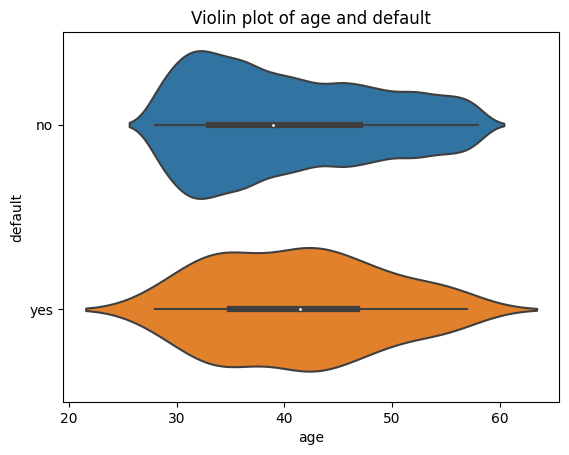

In [47]:
sns.violinplot(data=df1, x= 'age', y='default')
plt.title('Violin plot of age and default')

# Relationship between age and default layered with job type

Text(0.5, 1.0, 'Box plot of age and default layered with job')

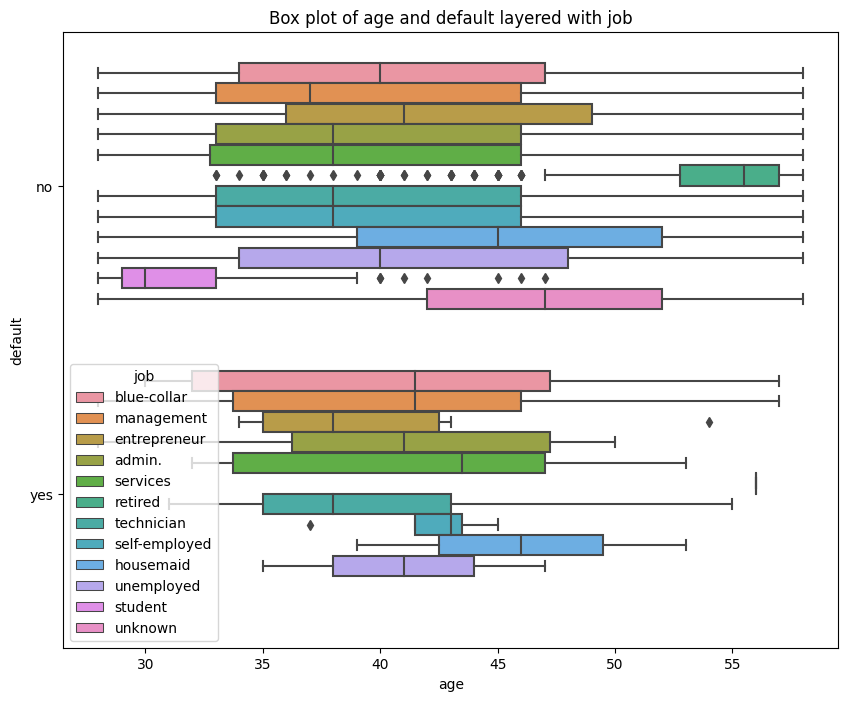

In [48]:
plt.figure(figsize=(10,8))
sns.boxplot(data=df1, x= 'age', y='default',hue= 'job')
plt.title('Box plot of age and default layered with job')

# Relationship between age and default layered with marital status

Text(0.5, 1.0, 'Box plot of age and default layered with marital')

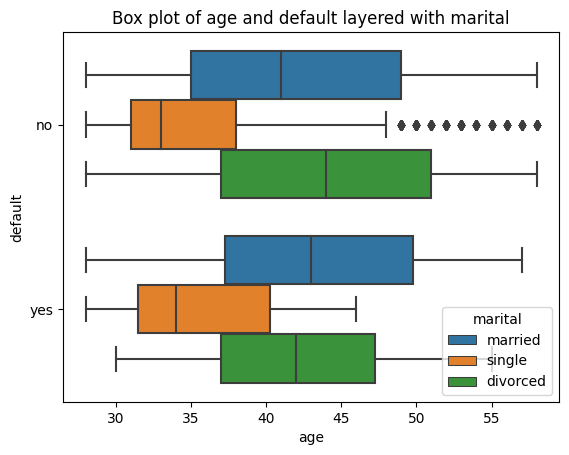

In [49]:
sns.boxplot(data=df1, x= 'age', y='default',hue= 'marital')
plt.title('Box plot of age and default layered with marital')

# Relationship between default and marital status

Text(0.5, 1.0, 'Heatmap of default and marital')

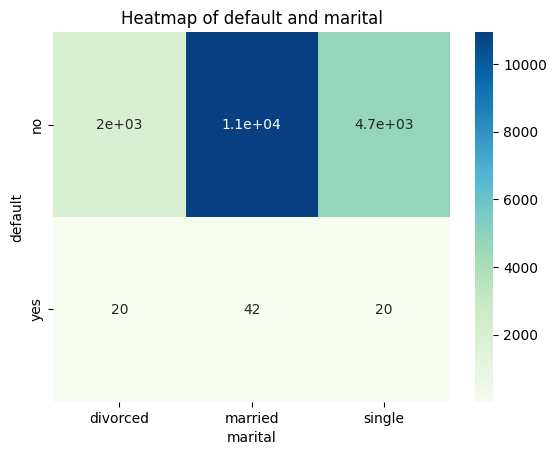

In [50]:
cross_tab = pd.crosstab(df1['default'], df['marital'])
sns.heatmap(cross_tab, annot=True, cmap='GnBu')
plt.title('Heatmap of default and marital')

<Axes: xlabel='default'>

<Figure size 1200x1000 with 0 Axes>

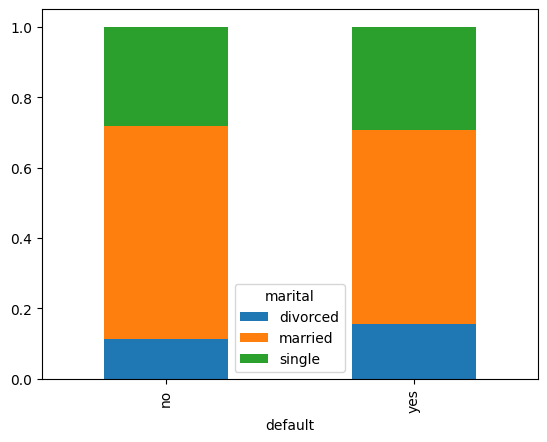

In [51]:
cross_tab_stack = pd.crosstab(df['default'], df['marital'])
stacked_data = cross_tab_stack.apply(lambda x: x / x.sum(), axis=1)

plt.figure(figsize=(12,10))
stacked_data.plot(kind='bar', stacked=True)

# Relationship between default and job type

Text(0.5, 1.0, 'Heatmap of job and default')

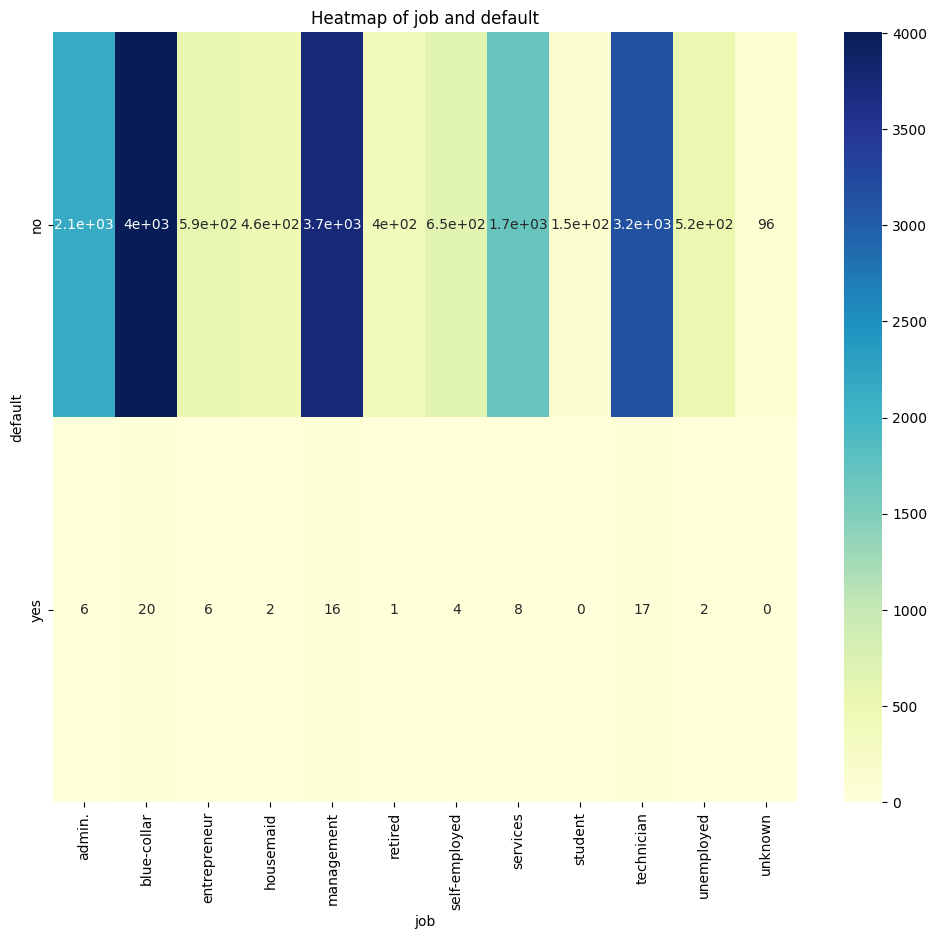

In [52]:
cross_tab_job = pd.crosstab(df1['default'], df['job'])
plt.figure(figsize=(12,10))
sns.heatmap(cross_tab_job, annot=True, cmap= 'YlGnBu')
plt.title('Heatmap of job and default')

Text(0.5, 1.0, 'Stacked chart of job and default')

<Figure size 1500x1200 with 0 Axes>

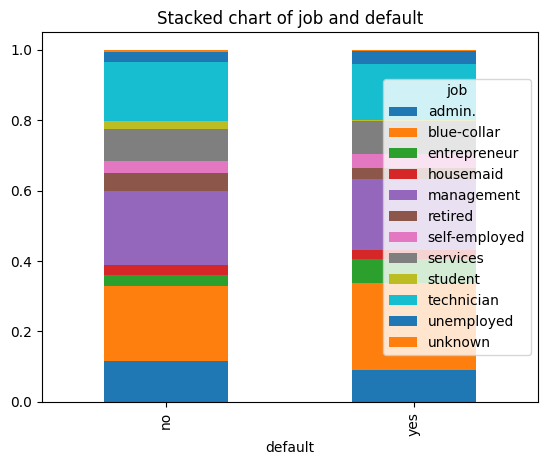

In [53]:
cross_tab_stacked_job = pd.crosstab(df['default'], df['job'])
stacked_data = cross_tab_stacked_job.apply(lambda x: x / x.sum(), axis=1)
plt.figure(figsize=(15,12))
stacked_data.plot(kind='bar', stacked=True)
plt.title('Stacked chart of job and default')

# Relationship between balance and housing loan

Text(0.5, 1.0, 'Violin plot of balance and housing')

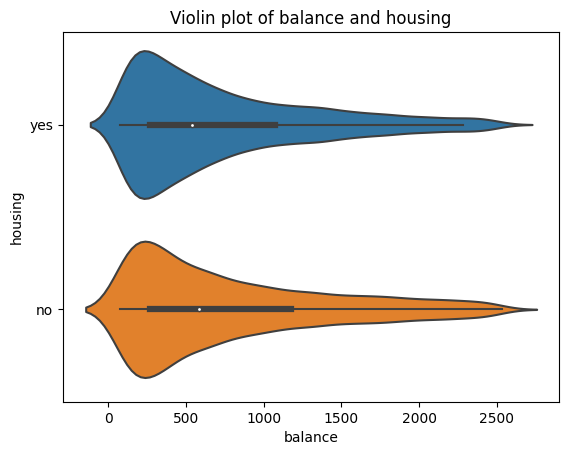

In [54]:
sns.violinplot(data=df1, x= 'balance', y='housing')
plt.title('Violin plot of balance and housing')

# Relationship between balance and housing loan layered by marital status

Text(0.5, 1.0, 'Violin plot of balance and housing layered by marital status')

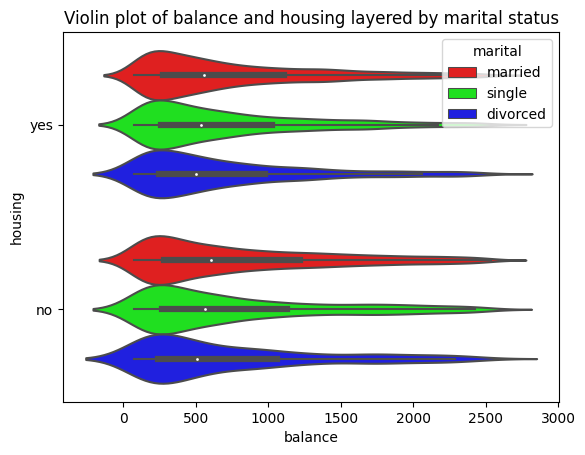

In [55]:
colors = ["#FF0000", "#00FF00", "#0000FF"]
sns.violinplot(data=df1, x= 'balance', y='housing',hue='marital',palette=colors)
plt.title('Violin plot of balance and housing layered by marital status')

# Relationship between default and housing loan

Text(0.5, 1.0, 'Heatmap of housing and default')

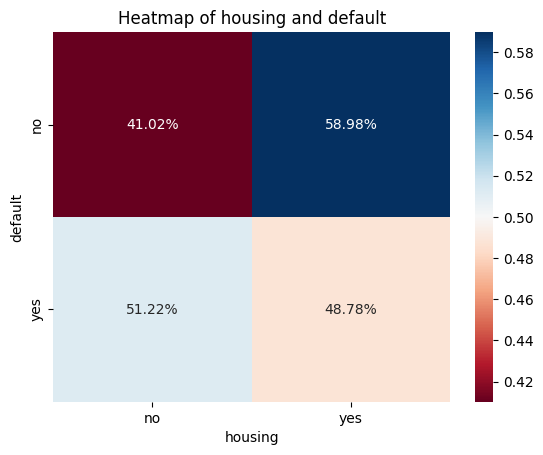

In [56]:
cross_tab_housing = pd.crosstab(df1['default'], df['housing'], normalize='index')  
sns.heatmap(cross_tab_housing, annot=True, cmap='RdBu', fmt='.2%')  
plt.title('Heatmap of housing and default')

Text(0.5, 1.0, 'Clustered chart of housing and default')

<Figure size 1500x1200 with 0 Axes>

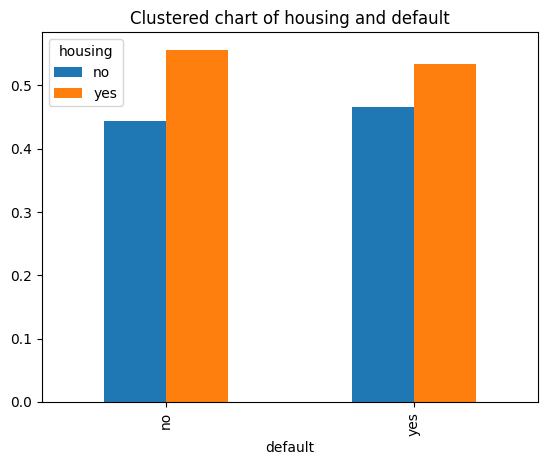

In [57]:
cross_tab_stacked_housing = pd.crosstab(df['default'], df['housing'])
stacked_data = cross_tab_stacked_housing.apply(lambda x: x / x.sum(), axis=1)
plt.figure(figsize=(15,12))
stacked_data.plot(kind='bar', stacked=False)
plt.title('Clustered chart of housing and default')

# Other multivariate analysis

# Visualization of bank balance by job categories

Text(0.5, 1.0, 'Violin plot of Job and bank balance')

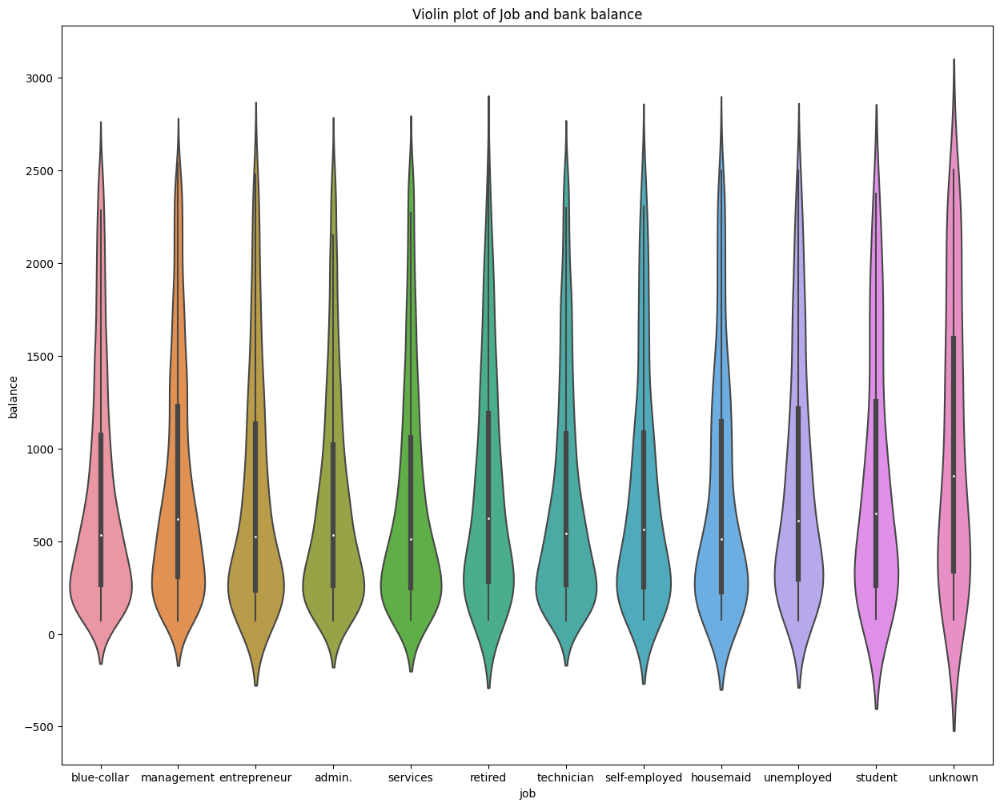

In [58]:
plt.figure(figsize=(15,12))
sns.violinplot(data=df1, x= 'job', y='balance')
plt.title('Violin plot of Job and bank balance')

# Visualization of bank balance layered by education category

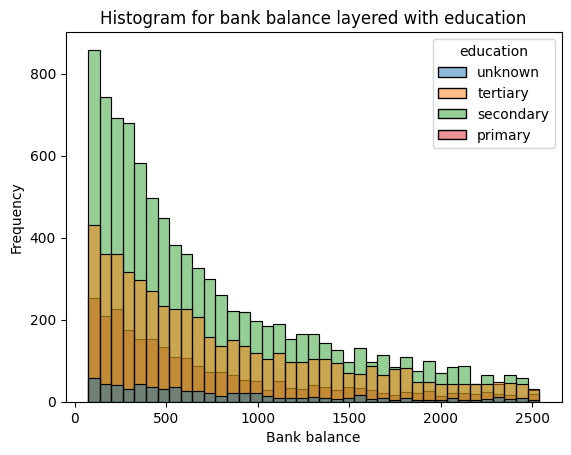

In [59]:
sns.histplot(data=df1, x='balance', hue= 'education')
plt.title('Histogram for bank balance layered with education')
plt.xlabel('Bank balance')
plt.ylabel('Frequency')
plt.show()

# Visualization of customer age layered by marital status

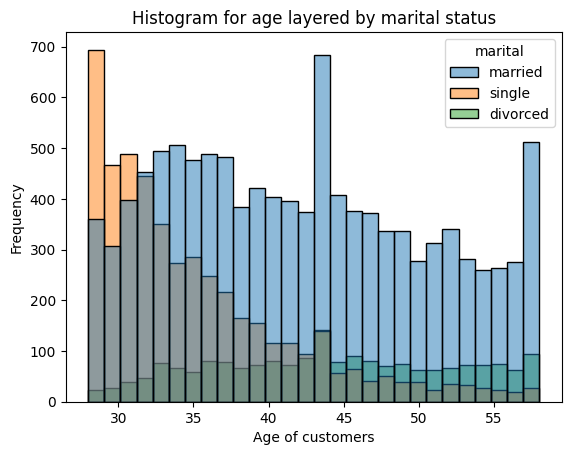

In [60]:
sns.histplot(data=df1, x='age', hue= 'marital')
plt.title('Histogram for age layered by marital status')
plt.xlabel('Age of customers')
plt.ylabel('Frequency')
plt.show()

# Chapter 3: Feature engineering

# Feature encoding

# Counting values in each feature

In [61]:
df1.head()

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
3,1004,47.000000,blue-collar,married,unknown,no,1506.00000,yes,no,unknown,5,may,92,1,-1,0,unknown,no
5,1006,35.000000,management,married,tertiary,no,231.00000,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,1007,28.000000,management,single,tertiary,no,447.00000,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,1008,40.954714,entrepreneur,divorced,tertiary,yes,1362.34662,yes,no,unknown,5,may,380,1,-1,0,unknown,no
10,1011,41.000000,admin.,divorced,secondary,no,270.00000,yes,no,unknown,5,may,222,1,-1,0,unknown,no


In [62]:
df1.job.value_counts()

blue-collar      4024
management       3746
technician       3176
admin.           2154
services         1712
self-employed     653
entrepreneur      599
unemployed        522
housemaid         457
retired           405
student           154
unknown            96
Name: job, dtype: int64

[Text(0, 0, '4024'),
 Text(0, 0, '3746'),
 Text(0, 0, '3176'),
 Text(0, 0, '2154'),
 Text(0, 0, '1712'),
 Text(0, 0, '653'),
 Text(0, 0, '599'),
 Text(0, 0, '522'),
 Text(0, 0, '457'),
 Text(0, 0, '405'),
 Text(0, 0, '154'),
 Text(0, 0, '96')]

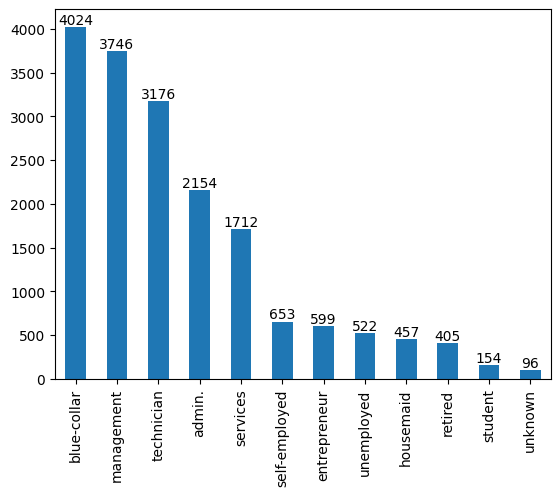

In [63]:
job_bar= df1.job.value_counts().plot(kind= 'bar')
job_bar.bar_label(job_bar.containers[0])

In [64]:
df1.marital.value_counts()

married     10984
single       4735
divorced     1979
Name: marital, dtype: int64

[Text(0, 0, '10984'), Text(0, 0, '4735'), Text(0, 0, '1979')]

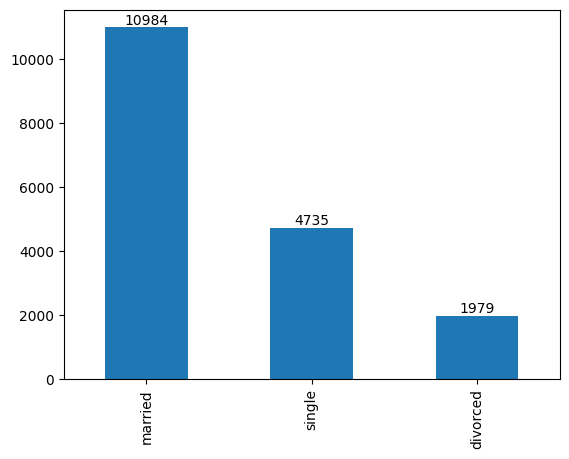

In [65]:
marital_bar= df1.marital.value_counts().plot(kind= 'bar')
marital_bar.bar_label(marital_bar.containers[0])

In [66]:
df1.education.value_counts()

secondary    9236
tertiary     5274
primary      2533
unknown       655
Name: education, dtype: int64

[Text(0, 0, '9236'), Text(0, 0, '5274'), Text(0, 0, '2533'), Text(0, 0, '655')]

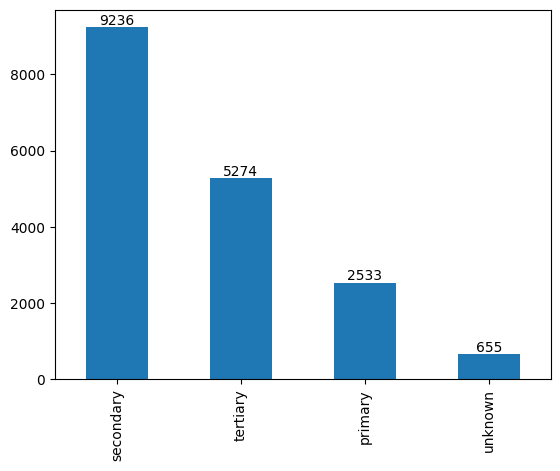

In [67]:
edu_bar= df1.education.value_counts().plot(kind= 'bar')
edu_bar.bar_label(edu_bar.containers[0])


In [68]:
df1.housing.value_counts()

yes    10430
no      7268
Name: housing, dtype: int64

[Text(0, 0, '10430'), Text(0, 0, '7268')]

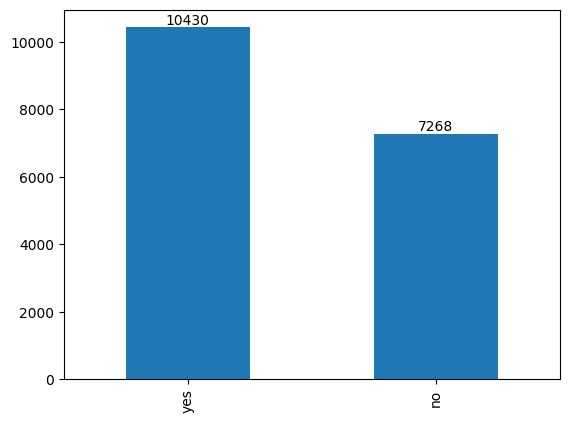

In [69]:
housing_bar= df1.housing.value_counts().plot(kind= 'bar')
housing_bar.bar_label(housing_bar.containers[0])

In [70]:
df1.default.value_counts()

no     17616
yes       82
Name: default, dtype: int64

[Text(0, 0, '17616'), Text(0, 0, '82')]

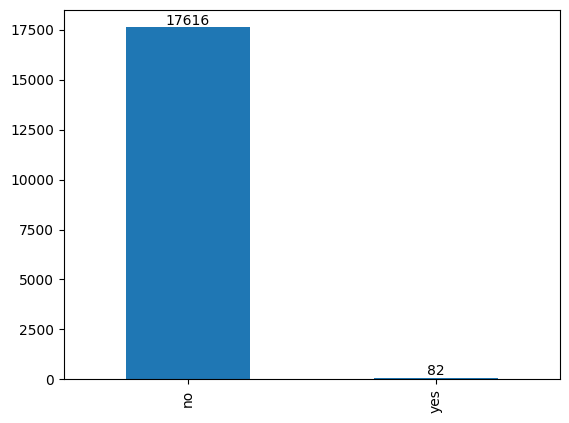

In [71]:
default_bar= df1.default.value_counts().plot(kind= 'bar')
default_bar.bar_label(default_bar.containers[0])

# Encoding using label encoder

In [72]:
encoder= LabelEncoder()

In [73]:
df1['job']= encoder.fit_transform(df1['job'])
df1['marital']= encoder.fit_transform(df1['marital'])
df1['education']= encoder.fit_transform(df1['education'])
df1['housing']= encoder.fit_transform(df1['housing'])
df1['default']= encoder.fit_transform(df1['default'])

In [74]:
df1.head(15)

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
3,1004,47.000000,1,1,3,0,1506.00000,1,no,unknown,5,may,92,1,-1,0,unknown,no
5,1006,35.000000,4,1,2,0,231.00000,1,no,unknown,5,may,139,1,-1,0,unknown,no
6,1007,28.000000,4,2,2,0,447.00000,1,yes,unknown,5,may,217,1,-1,0,unknown,no
7,1008,40.954714,2,0,2,1,1362.34662,1,no,unknown,5,may,380,1,-1,0,unknown,no
10,1011,41.000000,0,0,1,0,270.00000,1,no,unknown,5,may,222,1,-1,0,unknown,no
11,1012,29.000000,0,2,1,0,390.00000,1,no,unknown,5,may,137,1,-1,0,unknown,no
14,1015,57.000000,7,1,1,0,162.00000,1,no,unknown,5,may,174,1,-1,0,unknown,no
15,1016,51.000000,5,1,0,0,229.00000,1,no,unknown,5,may,353,1,-1,0,unknown,no
20,1021,28.000000,1,1,1,0,723.00000,1,yes,unknown,5,may,262,1,-1,0,unknown,no
21,1022,56.000000,4,1,2,0,779.00000,1,no,unknown,5,may,164,1,-1,0,unknown,no


In [75]:
df1.job.value_counts()

1     4024
4     3746
9     3176
0     2154
7     1712
6      653
2      599
10     522
3      457
5      405
8      154
11      96
Name: job, dtype: int64

In [76]:
df1.marital.value_counts()

1    10984
2     4735
0     1979
Name: marital, dtype: int64

In [77]:
df1.education.value_counts()

1    9236
2    5274
0    2533
3     655
Name: education, dtype: int64

In [78]:
df1.housing.value_counts()

1    10430
0     7268
Name: housing, dtype: int64

In [79]:
df1.default.value_counts()

0    17616
1       82
Name: default, dtype: int64

# Feature selection

# Principal component analysis


from sklearn.decomposition import PCA

pca= PCA(0.95)

X_pca= pca.fit_transform(X)
X_pca.shape

pca.explained_variance_ratio_

pca.n_components_


X_train, X_test, Y_train, Y_test = train_test_split(X_pca, Y, test_size= 0.2, random_state=2)

pca_test_model= LogisticRegression()

pca_test_model.fit(X_train,Y_train)

pca_test_model.score(X_train,Y_train)

pca_test_model.score(X_test,Y_test)

# The PCA ANALYSIS here provided the same test and train score but the PCA analysis reduced the dimension of features to one which limited our scope of analysis to use the other classification techniques such as Decision tree and random forest.
# Therefore, we will move forward with correlation based selection method since the test and train score are also unaffected

# Checking for features with highest correlation with the target variable

In [80]:
df1.head()

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
3,1004,47.000000,1,1,3,0,1506.00000,1,no,unknown,5,may,92,1,-1,0,unknown,no
5,1006,35.000000,4,1,2,0,231.00000,1,no,unknown,5,may,139,1,-1,0,unknown,no
6,1007,28.000000,4,2,2,0,447.00000,1,yes,unknown,5,may,217,1,-1,0,unknown,no
7,1008,40.954714,2,0,2,1,1362.34662,1,no,unknown,5,may,380,1,-1,0,unknown,no
10,1011,41.000000,0,0,1,0,270.00000,1,no,unknown,5,may,222,1,-1,0,unknown,no


# Correlation method of feature selection

<Axes: >

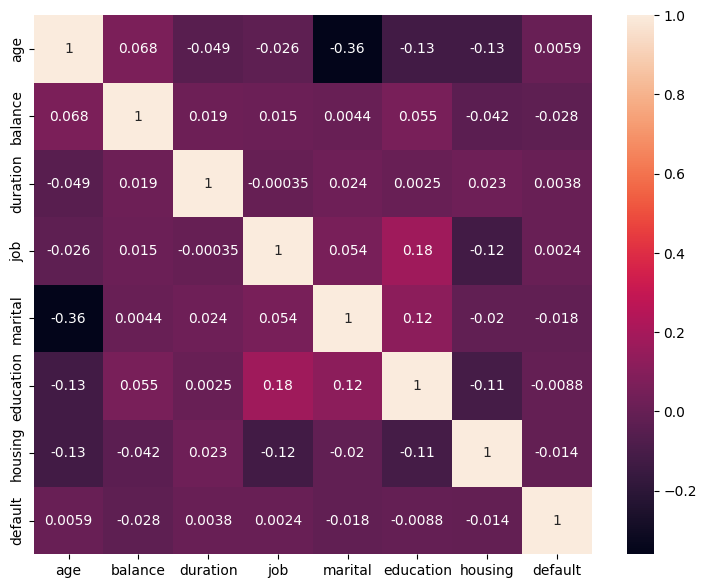

In [81]:
plt.figure(figsize=(9, 7))
sns.heatmap(df1[['age','balance','duration','job','marital','education','housing','default']].corr(), annot= True)

# We will take balance, marital and housing since they are the most correlated to the target variable/ variable of interest

# Segregating dependent and independent variables

In [82]:
X= df1[['balance','marital','housing']]
Y= df1['default']

In [83]:
print(X,Y)

          balance  marital  housing
3      1506.00000        1        1
5       231.00000        1        1
6       447.00000        2        1
7      1362.34662        0        1
10      270.00000        0        1
...           ...      ...      ...
45197  1511.00000        2        1
45198  1428.00000        1        0
45201   583.00000        1        0
45202   557.00000        2        0
45209   668.00000        1        0

[17698 rows x 3 columns] 3        0
5        0
6        0
7        1
10       0
        ..
45197    0
45198    0
45201    0
45202    0
45209    0
Name: default, Length: 17698, dtype: int32


# Checking for multicollinearity between the features

<Axes: >

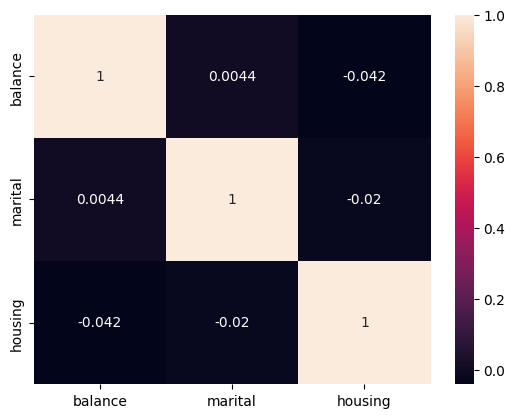

In [84]:
sns.heatmap(df1[['balance','marital','housing']].corr(), annot= True)

# Chapter 4: Preparation for Machine Learning modelling

# Splitting the features and target into test and train data 

In [85]:

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size= 0.2, random_state=2)

In [86]:
print(X.shape, X_train.shape, X_test.shape)

(17698, 3) (14158, 3) (3540, 3)


# Chapter 5: Predictive analysis using machine learning models

# "Model": Logistic regression

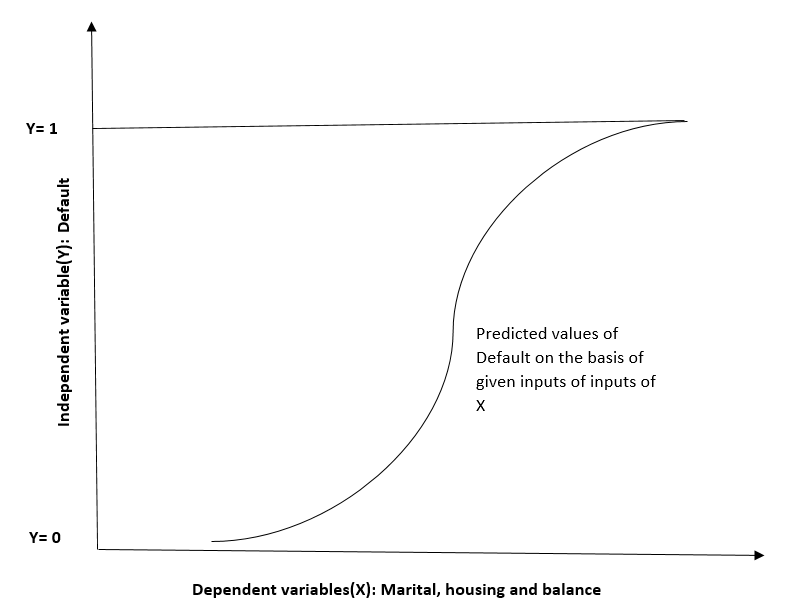

In [87]:
model= LogisticRegression()

In [88]:
model.fit(X_train,Y_train)

LogisticRegression()

ACCURACY CHECK on Train data

In [89]:
model.score(X_train,Y_train)

0.9956914818477186

# Or alternatively,

In [90]:
X_train_pred= model.predict(X_train)

In [91]:
train_accuracy= accuracy_score(Y_train, X_train_pred)

In [92]:
print("Accuracy of training data is :", train_accuracy)

Accuracy of training data is : 0.9956914818477186


# Here, the accuracy score for train data is way above 99, therefore the model cant get better than this

# ACCURACY CHECK on Test data

In [93]:
X_test_pred= model.predict(X_test)

In [94]:
test_accuracy= accuracy_score(Y_test,X_test_pred)

In [95]:
print("Accuracy of test data is :", test_accuracy)

Accuracy of test data is : 0.9940677966101695


# Here, the accuracy score for test data is way above 99, therefore the model is valid

# Actual prediction

In [96]:
X.head()

,balance,marital,housing
3,1506.00000,1,1
5,231.00000,1,1
6,447.00000,2,1
7,1362.34662,0,1
10,270.00000,0,1


In [97]:
default= {
    'balance':500,
    'marital':1,
    'housing': 1
}

In [98]:
default= pd.DataFrame([default])

In [99]:
logistic_pred= model.predict(default)

In [100]:
if logistic_pred == 0:
    print("Null hypothesis is accepted i.e The customer is unlikely to default")
else:
    print("Alternative hypothesis is accepted i.e The customer is likely to default")

Null hypothesis is accepted i.e The customer is unlikely to default


# Evaluation and Visualization of logistic prediction

In [101]:
from sklearn.metrics import confusion_matrix
cm= confusion_matrix(Y_test, X_test_pred)

Text(0.5, 1.0, 'Confusion Matrix')

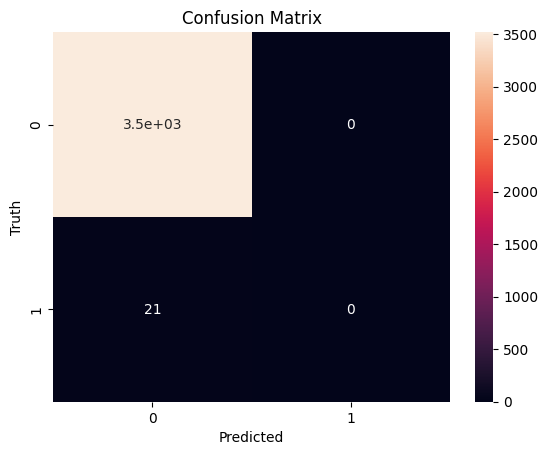

In [102]:
sns.heatmap(cm, annot= True)
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.title('Confusion Matrix')

# "Model 1": Naive Bayes classification algorithm

Bayes' theorem is a fundamental concept in probability theory and statistics. It provides a way to update the probability of an event based on new evidence or information.

# P(A|B) = (P(B|A) * P(A)) / P(B)



Since we are applying Naive bayes to 

# Classify defaulters from non defaulters, lets us undersrand the theorem in our context

# (P(Default)/Bank balance, Marital status, Housing loan)

Also, we will make some

# NAIVE ASSUMPTION:
# - Features Bank balance, Marital status, Housing loan are independent of each other (No multicollinearity) 


In [103]:

model1 = GaussianNB()

In [104]:
model1.fit(X_train, Y_train)

GaussianNB()

# Accuracy on train data

In [105]:
model1.score(X_train, Y_train)

0.9956914818477186

# Accuracy on test data

In [106]:
model1.score(X_test, Y_test)

0.9940677966101695

# Actual prediction

In [107]:
naive_pred= model1.predict(default)

In [108]:
if naive_pred == 0:
    print("Null hypothesis is accepted i.e The customer is unlikely to default")
else:
    print("Alternative hypothesis is accepted i.e The customer is likely to default")

Null hypothesis is accepted i.e The customer is unlikely to default


# "Model 2": K-nearest neighbor Algorithm

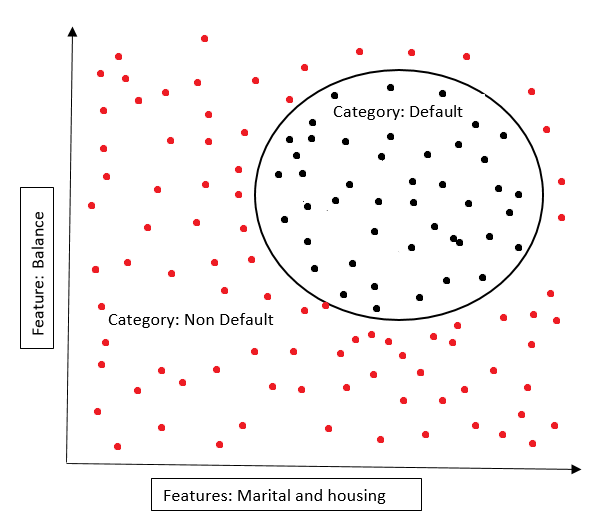

In [109]:
model2= KNeighborsClassifier(n_neighbors=3)

In [110]:
model2.fit(X_train, Y_train)

KNeighborsClassifier(n_neighbors=3)

# Accuracy score on train data

In [111]:
model2.score(X_train, Y_train)

0.9959740076281961

# Accuracy score on test data

In [112]:
model2.score(X_test, Y_test)

0.9937853107344633

# Actual prediction

In [113]:
knn_pred= model2.predict(default)

In [114]:
if knn_pred == 0:
    print("Null hypothesis is accepted i.e The customer is unlikely to default")
else:
    print("Alternative hypothesis is accepted i.e The customer is likely to default")

Null hypothesis is accepted i.e The customer is unlikely to default


# "Model 3": Decision Tree Algorithm

In [115]:
model3= tree.DecisionTreeClassifier(max_depth=3)

In [116]:
model3.fit(X_train, Y_train)

DecisionTreeClassifier(max_depth=3)

# Accuracy on train data

In [117]:
model3.score(X_train, Y_train)

0.9956914818477186

# Accuracy on test data

In [118]:
model3.score(X_test, Y_test)

0.9940677966101695

# Actual prediction

In [119]:
Tree_pred= model3.predict(default)

In [120]:
if Tree_pred == 0:
    print("Null hypothesis is accepted i.e The customer is unlikely to default")
else:
    print("Alternative hypothesis is accepted i.e The customer is likely to default")

Null hypothesis is accepted i.e The customer is unlikely to default


# Visualization of decision tree

In [121]:
from sklearn.tree import plot_tree

# Note: It takes a lot of time for the following code to visualize the decision tree.

# PLEASE BE PATIENT

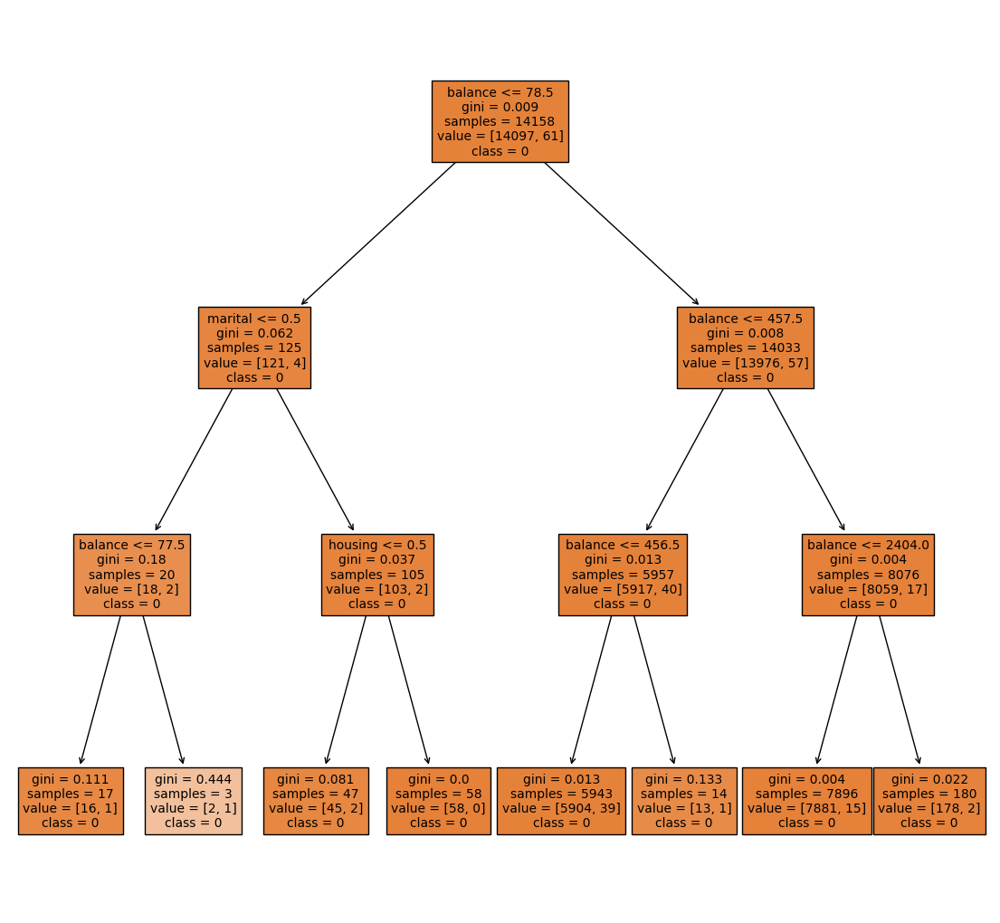

In [123]:
plt.figure("Decision Tree", figsize=[14,13])
class_names = Y.unique().astype(str)
tree.plot_tree(model3, fontsize=10, filled=True, feature_names=X.columns, class_names=class_names)
plt.show()


# Model 4: Support vector machines Algorithm

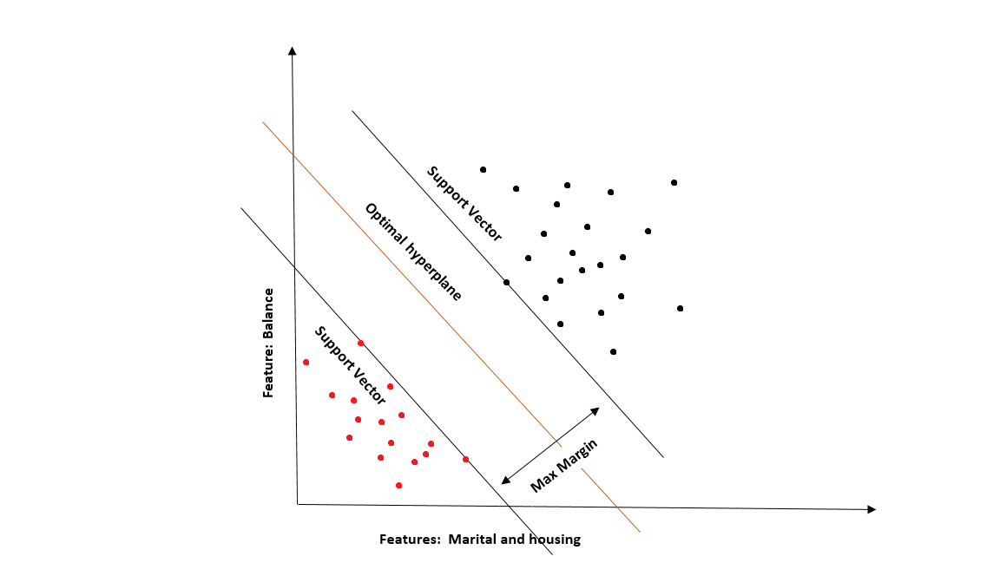

In [124]:
model4= SVC()

In [125]:
model4.fit(X_train, Y_train)

SVC()

# Accuracy on train data

In [126]:
model4.score(X_train, Y_train)

0.9956914818477186

# Accuracy on test data

In [127]:
model4.score(X_test, Y_test)

0.9940677966101695

# Actual prediction

In [128]:
svc_pred= model4.predict(default)

In [129]:
if svc_pred == 0:
    print("Null hypothesis is accepted i.e The customer is unlikely to default")
else:
    print("Alternative hypothesis is accepted i.e The customer is likely to default")

Null hypothesis is accepted i.e The customer is unlikely to default


# Model 5: Random forest classifier

In [130]:
model5 = RandomForestClassifier(n_estimators=5, random_state=42)

In [131]:
model5.fit(X_train, Y_train)

RandomForestClassifier(n_estimators=5, random_state=42)

# Accuracy on train data

In [132]:
model5.score(X_train, Y_train)

0.9964684277440317

# Accuracy on test data

In [133]:
model5.score(X_test, Y_test)

0.9929378531073446

# Actual prediction

In [134]:
random_pred= model5.predict(default)

In [135]:
if random_pred == 0:
    print("Null hypothesis is accepted i.e The customer is unlikely to default")
else:
    print("Alternative hypothesis is accepted i.e The customer is likely to default")

Null hypothesis is accepted i.e The customer is unlikely to default


# Visualization of Random forest model

# Note: It takes a lot of time for the following code to visualize the random forest trees. 
# PLEASE BE PATIENT

In [136]:
import math

estimators = model5.estimators_
num_estimators = len(estimators)
num_rows = math.ceil(math.sqrt(num_estimators))
num_cols = math.ceil(num_estimators / num_rows)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(40, 38), dpi=300)

for i, ax in enumerate(axes.flatten()):
    if i < num_estimators:
        ax.set_title('Tree {}'.format(i + 1))
        tree.plot_tree(estimators[i], ax=ax, fontsize=6, filled=True, feature_names=X.columns)
    else:
        fig.delaxes(ax)

plt.tight_layout()
plt.show()

# Chapter 6: Selection of the best model

# Cross validation(Stratified K fold method)

In [137]:
from sklearn.model_selection import StratifiedKFold
folds= StratifiedKFold(n_splits=5)

In [138]:
from sklearn.model_selection import cross_val_score

# Calculating the cross validation score and standard deviation between the folds for each model

# For "Model": Logistic regression

In [139]:
cross_val_score(model, X, Y)

array([0.99548023, 0.99519774, 0.99519774, 0.99547895, 0.99547895])

In [140]:
std_model = np.array([0.99548023, 0.99519774, 0.99519774, 0.99547895, 0.99547895])
std_dev = np.std(std_model)

print(std_dev)

0.00013797401688719847


# For "Model 1": Naive Bayesian regression

In [141]:
cross_val_score(model1, X, Y)

array([0.99548023, 0.99519774, 0.99519774, 0.99547895, 0.99547895])

In [142]:
std_model1 = np.array([0.99548023, 0.99519774, 0.99519774, 0.99547895, 0.99547895])
std_dev1 = np.std(std_model1)

print(std_dev1)

0.00013797401688719847


# For "Model 2": K Nearest neighbor

In [143]:
cross_val_score(model2, X, Y)

array([0.99491525, 0.99491525, 0.99519774, 0.99547895, 0.99491382])

In [144]:
std_model2 = np.array([0.99491525, 0.99491525, 0.99519774, 0.99547895, 0.99491382])
std_dev2 = np.std(std_model2)

print(std_dev2)

0.00022575936015146265


# For “Model 3”: Decision tree

In [145]:
cross_val_score(model3, X, Y)

array([0.99548023, 0.99519774, 0.99519774, 0.99547895, 0.99547895])

In [146]:
std_model3 = np.array([0.99265537, 0.99378531, 0.9920904 , 0.99463125, 0.99463125])
std_dev3 = np.std(std_model3)

print(std_dev3)

0.0010318904083980714


# For “Model 4”: Support vector machine

In [147]:
cross_val_score(model4, X, Y)

array([0.99548023, 0.99519774, 0.99519774, 0.99547895, 0.99547895])

In [148]:
std_model4 = np.array([0.99548023, 0.99519774, 0.99519774, 0.99547895, 0.99547895])
std_dev4 = np.std(std_model4)

print(std_dev4)

0.00013797401688719847


# For “Model 5”: Random forest classifier

In [149]:
cross_val_score(model5, X, Y)

array([0.99378531, 0.99293785, 0.99011299, 0.99293586, 0.99180559])

In [150]:
std_model5 = np.array([0.9940678 , 0.99350282, 0.99180791, 0.99434869, 0.99406612])
std_dev5 = np.std(std_model5)

print(std_dev5)

0.0009175107912041146


# Visualization of std deviation of models across the folds

In [151]:
std_scores = [0.00013797401688719847,0.00013797401688719847 ,0.00022575936015146265,0.0010318904083980714,0.00013797401688719847,0.0009175107912041146 ]
score_names = ['Logistic_std', 'Naive_std','KNN_std', 'DTree_std', 'SVM_std', 'Rforest_std']
best_model = pd.DataFrame({'Standard Deviation': std_scores}, index=score_names)
print(best_model)

              Standard Deviation
Logistic_std            0.000138
Naive_std               0.000138
KNN_std                 0.000226
DTree_std               0.001032
SVM_std                 0.000138
Rforest_std             0.000918


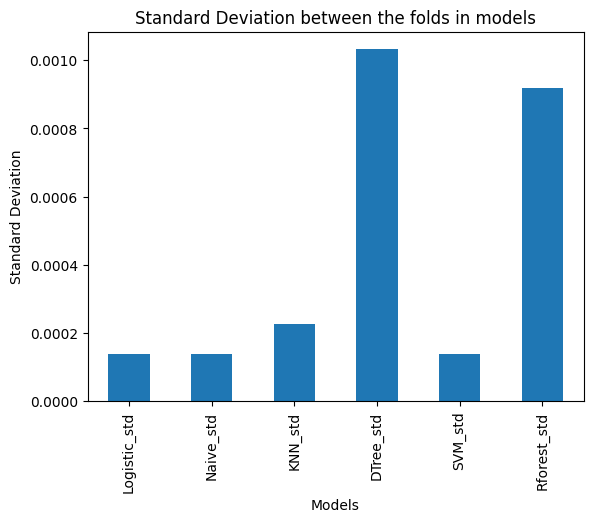

In [152]:
best_model.plot(kind='bar', legend=None)
plt.xlabel('Models')
plt.ylabel('Standard Deviation')
plt.title('Standard Deviation between the folds in models')
plt.show()

# Three models Logistic Regression, Naive Bayes regression and Support Vector Machines has the same LOWEST standard eviation accross the folds. Any model can be chosen. We willl be choosing the Logistic regression model.